<a href="https://colab.research.google.com/github/ThiruvarankanM/Face_Mask_Detection_CNN/blob/main/Face_Mask_Detection_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle

In [2]:
# Set random seeds for reproducibility and print package versions
import random
import numpy as np
import tensorflow as tf
import os
import sys
import matplotlib
import PIL
print('Python version:', sys.version)
print('Numpy version:', np.__version__)
print('TensorFlow version:', tf.__version__)
print('Matplotlib version:', matplotlib.__version__)
print('PIL version:', PIL.__version__)
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

Python version: 3.12.11 (main, Jun  4 2025, 08:56:18) [GCC 11.4.0]
Numpy version: 2.0.2
TensorFlow version: 2.19.0
Matplotlib version: 3.10.0
PIL version: 11.3.0


In [4]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [5]:
# API to fetch the dataset from Kaggle
!kaggle datasets download -d omkargurav/face-mask-dataset

Dataset URL: https://www.kaggle.com/datasets/omkargurav/face-mask-dataset
License(s): unknown
 78% 127M/163M [00:00<00:00, 1.32GB/s]
100% 163M/163M [00:00<00:00, 1.21GB/s]


In [6]:
# extracting the compessed Dataset
from zipfile import ZipFile
dataset = '/content/face-mask-dataset.zip'

with ZipFile(dataset,'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [7]:
!ls

data  drive  face-mask-dataset.zip  kaggle.json  sample_data


In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from sklearn.model_selection import train_test_split

In [10]:
with_mask_files = os.listdir('/content/data/with_mask')
print(with_mask_files[0:5])
print(with_mask_files[-5:])

['with_mask_148.jpg', 'with_mask_227.jpg', 'with_mask_2164.jpg', 'with_mask_1691.jpg', 'with_mask_509.jpg']
['with_mask_1595.jpg', 'with_mask_2742.jpg', 'with_mask_1930.jpg', 'with_mask_3457.jpg', 'with_mask_3547.jpg']


In [11]:
without_mask_files = os.listdir('/content/data/without_mask')
print(without_mask_files[0:5])
print(without_mask_files[-5:])

['without_mask_667.jpg', 'without_mask_1415.jpg', 'without_mask_1949.jpg', 'without_mask_572.jpg', 'without_mask_2707.jpg']
['without_mask_1221.jpg', 'without_mask_1532.jpg', 'without_mask_1380.jpg', 'without_mask_2929.jpg', 'without_mask_747.jpg']


In [13]:
print('Number of images with mask :', len(with_mask_files))
print('Number of images without mask :', len(without_mask_files))

Number of images with mask : 3725
Number of images without mask : 3828


**Creating Labels for the two class of Images**

with mask  -->  1

without mask  -->  0

In [17]:
# create the labels dynamically based on the number of files
with_mask_labels = [1] * len(with_mask_files)
without_mask_labels = [0] * len(without_mask_files)
print(f"with mask labels:- {with_mask_labels[0:5]}")
print(f"without mask labels:- {without_mask_labels[0:5]}")

with mask labels:- [1, 1, 1, 1, 1]
without mask labels:- [0, 0, 0, 0, 0]


In [18]:
print(len(with_mask_labels))
print(len(without_mask_labels))

3725
3828


In [19]:
labels = with_mask_labels + without_mask_labels

print(len(labels))
print(labels[0:5])
print(labels[-5:])

7553
[1, 1, 1, 1, 1]
[0, 0, 0, 0, 0]


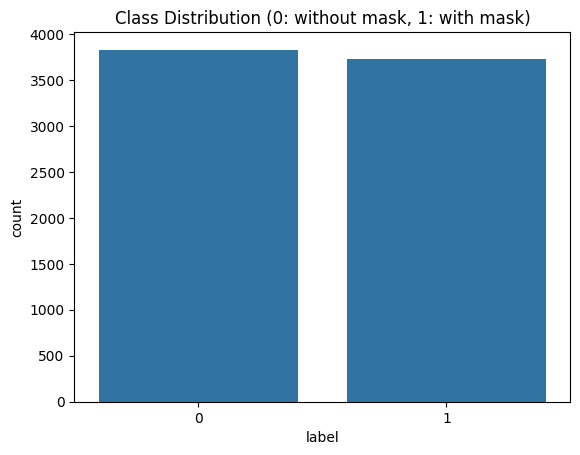

In [21]:
# Visualize class distribution
import seaborn as sns
import pandas as pd
labels_df = pd.DataFrame({'label': labels})
sns.countplot(x='label', data=labels_df)
plt.title('Class Distribution (0: without mask, 1: with mask)')
plt.show()

In [24]:
# Define the paths to the image directories
with_mask_path = '/content/data/with_mask/'
without_mask_path = '/content/data/without_mask/'

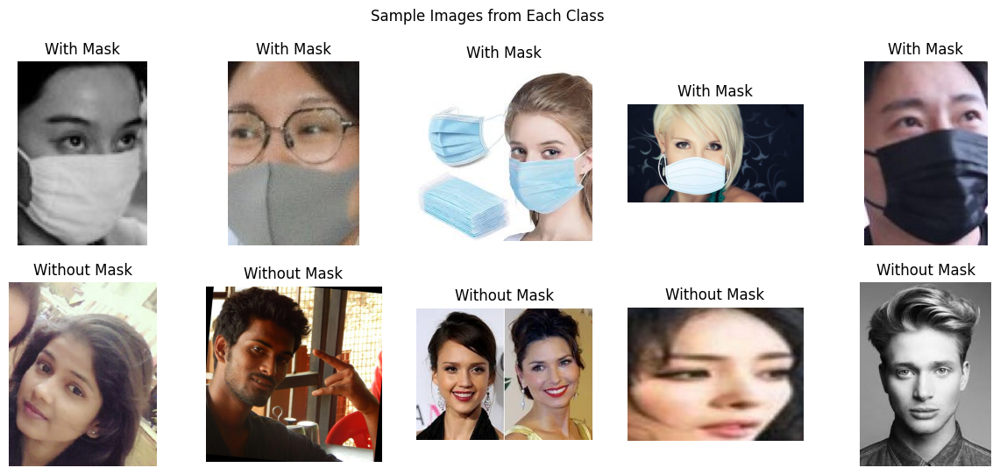

In [27]:
# Show sample images from both classes
fig, axes = plt.subplots(2, 5, figsize=(15, 6))

for i in range(5):
    # With Mask
    axes[0, i].imshow(mpimg.imread(with_mask_path + with_mask_files[i]))
    axes[0, i].set_title("With Mask")
    axes[0, i].axis("off")

    # Without Mask
    axes[1, i].imshow(mpimg.imread(without_mask_path + without_mask_files[i]))
    axes[1, i].set_title("Without Mask")
    axes[1, i].axis("off")

plt.suptitle("Sample Images from Each Class")
plt.show()

**Image Processing**

1. Resize the Images

2. Convert the images to numpy arrays

In [28]:
# convert images to numpy arrays+

with_mask_path = '/content/data/with_mask/'

data = []

for img_file in with_mask_files:

  image = Image.open(with_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)



without_mask_path = '/content/data/without_mask/'


for img_file in without_mask_files:

  image = Image.open(without_mask_path + img_file)
  image = image.resize((128,128))
  image = image.convert('RGB')
  image = np.array(image)
  data.append(image)

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [30]:
type(data)

list

In [31]:
len(data)

7553

array([[[  0,   0,   0],
        [  0,   0,   0],
        [  0,   0,   0],
        ...,
        [  1,   1,   1],
        [  5,   5,   5],
        [  7,   7,   7]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  5,   5,   5],
        [  7,   7,   7],
        [  8,   8,   8]],

       [[  0,   0,   0],
        [  0,   0,   0],
        [  1,   1,   1],
        ...,
        [  6,   6,   6],
        [  7,   7,   7],
        [  8,   8,   8]],

       ...,

       [[ 61,  61,  61],
        [ 56,  56,  56],
        [ 48,  48,  48],
        ...,
        [176, 176, 176],
        [182, 182, 182],
        [185, 185, 185]],

       [[ 51,  51,  51],
        [ 45,  45,  45],
        [ 33,  33,  33],
        ...,
        [173, 173, 173],
        [179, 179, 179],
        [182, 182, 182]],

       [[ 33,  33,  33],
        [ 27,  27,  27],
        [ 15,  15,  15],
        ...,
        [171, 171, 171],
        [178, 178, 178],
        [181, 181, 181]]], dtype=uint8)
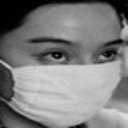

In [32]:
data[0]

In [33]:
type(data[0])

numpy.ndarray

In [34]:
data[0].shape

(128, 128, 3)

In [35]:
# converting image list and label list to numpy arrays
X = np.array(data)
Y = np.array(labels)

In [36]:
print(X.shape)
print(Y.shape)

(7553, 128, 128, 3)
(7553,)


In [37]:
print(Y)

[1 1 1 ... 0 0 0]


**Training Data**

In [39]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)
print(X.shape, X_train.shape, X_test.shape)

(7553, 128, 128, 3) (6042, 128, 128, 3) (1511, 128, 128, 3)


In [40]:
# scaling the data
X_train_scaled = X_train/255
X_test_scaled = X_test/255

In [41]:
X_train_scaled[0]

array([[[0.10980392, 0.10980392, 0.11764706],
        [0.10980392, 0.10980392, 0.11764706],
        [0.10980392, 0.10980392, 0.11764706],
        ...,
        [0.57254902, 0.59607843, 0.60784314],
        [0.72941176, 0.74901961, 0.76078431],
        [0.8       , 0.81960784, 0.83137255]],

       [[0.10980392, 0.10980392, 0.11764706],
        [0.10980392, 0.10980392, 0.11764706],
        [0.10588235, 0.10588235, 0.11372549],
        ...,
        [0.40392157, 0.42352941, 0.43529412],
        [0.61568627, 0.63529412, 0.64705882],
        [0.80784314, 0.82745098, 0.83921569]],

       [[0.11764706, 0.11764706, 0.1254902 ],
        [0.11372549, 0.11372549, 0.12156863],
        [0.10980392, 0.10980392, 0.11764706],
        ...,
        [0.36078431, 0.37647059, 0.38823529],
        [0.48235294, 0.50196078, 0.51372549],
        [0.6       , 0.61960784, 0.63137255]],

       ...,

       [[0.84313725, 0.81568627, 0.80392157],
        [0.80784314, 0.77647059, 0.76470588],
        [0.74901961, 0

**Building a Convolutional Neural Networks (CNN)**

In [42]:
import tensorflow as tf
from tensorflow import keras

In [43]:
num_of_classes = 2

model = keras.Sequential()

model.add(keras.layers.Conv2D(32, kernel_size=(3,3), activation='relu', input_shape=(128,128,3)))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(64, kernel_size=(3,3), activation='relu'))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Flatten())

model.add(keras.layers.Dense(128, activation='relu'))
model.add(keras.layers.Dropout(0.5))

model.add(keras.layers.Dense(64, activation='relu'))
model.add(keras.layers.Dropout(0.5))


model.add(keras.layers.Dense(num_of_classes, activation='sigmoid'))

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [44]:
# compile the neural network
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['acc'])

In [45]:
# Add EarlyStopping and ModelCheckpoint callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
model_ckpt = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

In [46]:
# training the neural network with callbacks and more epochs
history = model.fit(X_train_scaled, Y_train, validation_split=0.1, epochs=20, callbacks=[early_stop, model_ckpt])

Epoch 1/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - acc: 0.7210 - loss: 0.5490

170/170 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - acc: 0.7215 - loss: 0.5483 - val_acc: 0.8777 - val_loss: 0.2445
Epoch 2/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - acc: 0.8901 - loss: 0.2837

170/170 ━━━━━━━━━━━━━━━━━━━━ 12s 19ms/step - acc: 0.8901 - loss: 0.2836 - val_acc: 0.9058 - val_loss: 0.2064
Epoch 3/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - acc: 0.9091 - loss: 0.2383

170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - acc: 0.9091 - loss: 0.2383 - val_acc: 0.9140 - val_loss: 0.1969
Epoch 4/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - acc: 0.9241 - loss: 0.2043 - val_acc: 0.9074 - val_loss: 0.1989
Epoch 5/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - acc: 0.9424 - loss: 0.1641 - val_acc: 0.9107 - val_loss: 0.2358
Epoch 6/20
170/170 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - acc: 0.9447 - loss: 0.1556 - val_acc: 0.9190 - val_loss: 0.2378


**Model Evaluation**

In [48]:
# Make predictions on the test data
y_pred = model.predict(X_test_scaled)
y_pred_labels = np.argmax(y_pred, axis=1)

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step


48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


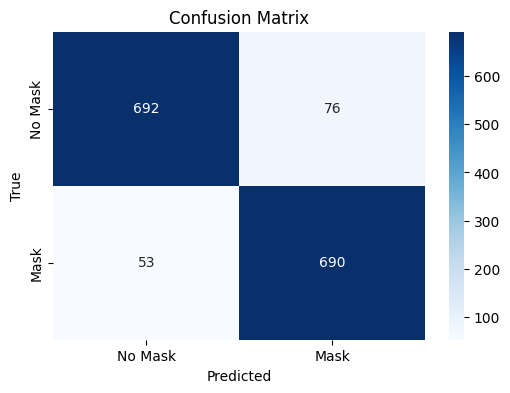

Classification Report:
              precision    recall  f1-score   support

     No Mask       0.93      0.90      0.91       768
        Mask       0.90      0.93      0.91       743

    accuracy                           0.91      1511
   macro avg       0.91      0.91      0.91      1511
weighted avg       0.92      0.91      0.91      1511



In [50]:
# Show confusion matrix and classification report
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
y_pred = model.predict(X_test_scaled)
y_pred_labels = np.argmax(y_pred, axis=1)
cm = confusion_matrix(Y_test, y_pred_labels)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Mask', 'Mask'], yticklabels=['No Mask', 'Mask'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()
print('Classification Report:')
print(classification_report(Y_test, y_pred_labels, target_names=['No Mask', 'Mask']))

In [51]:
loss, accuracy = model.evaluate(X_test_scaled, Y_test)
print('Test Accuracy =', accuracy)

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - acc: 0.9119 - loss: 0.2415
Test Accuracy = 0.9146260619163513


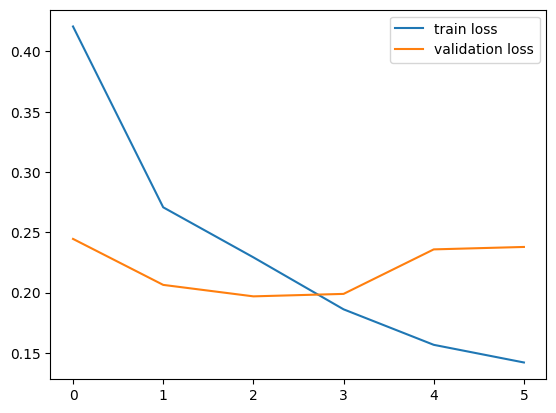

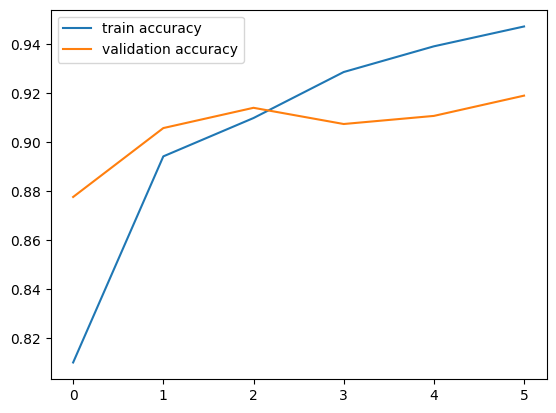

In [52]:
h = history
# plot the loss value
plt.plot(h.history['loss'], label='train loss')
plt.plot(h.history['val_loss'], label='validation loss')
plt.legend()
plt.show()

# plot the accuracy value
plt.plot(h.history['acc'], label='train accuracy')
plt.plot(h.history['val_acc'], label='validation accuracy')
plt.legend()
plt.show()

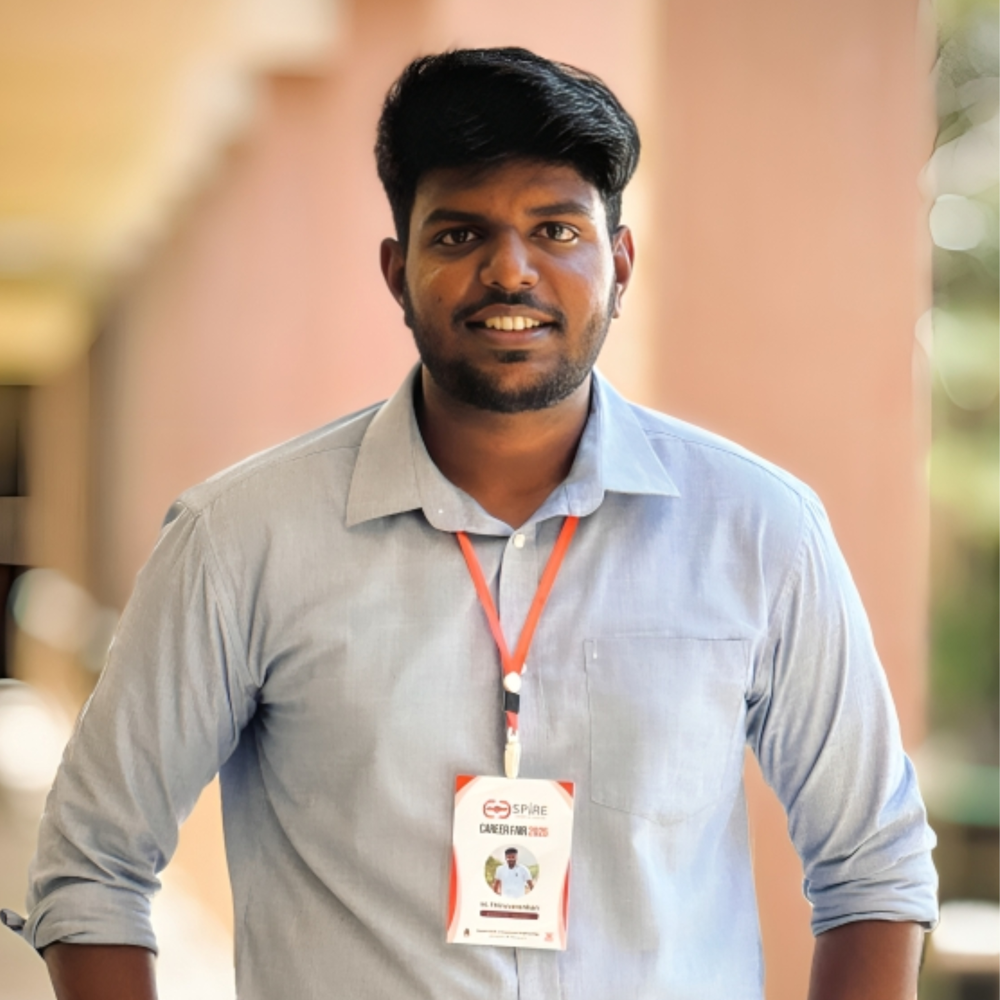

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 832ms/step
[[0.56149536 0.47662407]]
0
The person in the image is not wearing a mask


FileUpload(value={}, accept='.jpg,.png', description='Upload')

In [54]:
# Use a file picker widget for image prediction (Jupyter only)
import ipywidgets as widgets
from IPython.display import display
uploader = widgets.FileUpload(accept='.jpg,.png', multiple=False)
display(uploader)

def on_upload_change(change):
    if uploader.value:
        for name, file_info in uploader.value.items():
            import io
            import cv2
            import numpy as np
            file_bytes = np.frombuffer(file_info['content'], dtype=np.uint8)
            input_image = cv2.imdecode(file_bytes, cv2.IMREAD_COLOR)
            cv2_imshow(input_image)
            input_image_resized = cv2.resize(input_image, (128,128))
            input_image_scaled = input_image_resized/255
            input_image_reshaped = np.reshape(input_image_scaled, [1,128,128,3])
            input_prediction = model.predict(input_image_reshaped)
            print(input_prediction)
            input_pred_label = np.argmax(input_prediction)
            print(input_pred_label)
            if input_pred_label == 1:
                print('The person in the image is wearing a mask')
            else:
                print('The person in the image is not wearing a mask')

uploader.observe(on_upload_change, names='value')